<a href="https://colab.research.google.com/github/blue0620/NDLkotenOCR-GoogleColabVersion/blob/main/NDLkotensekiOCR_googlecolabversion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 0. GPUの情報を確認する

In [1]:
!nvidia-smi

Tue Jan 24 14:03:14 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   66C    P0    29W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# 1. NDLOCRのリポジトリをcloneする


In [2]:
!git clone --recursive https://github.com/ndl-lab/ndlkotenocr_cli

Cloning into 'ndlkotenocr_cli'...
remote: Enumerating objects: 103, done.
remote: Counting objects: 100% (103/103), done.
remote: Compressing objects: 100% (74/74), done.
remote: Total 103 (delta 37), reused 74 (delta 23), pack-reused 0
Receiving objects: 100% (103/103), 273.55 KiB | 19.54 MiB/s, done.
Resolving deltas: 100% (37/37), done.


# 2. 必要なパッケージをインストールする

In [3]:
PROJECT_DIR="/content/ndlkotenocr_cli"

In [4]:
!pip install torch==1.8.1+cu111 torchvision==0.9.1+cu111 -f https://download.pytorch.org/whl/lts/1.8/torch_lts.html
!pip install mmcv-full==1.5.3 -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.8.0/index.html
!pip install -r {PROJECT_DIR}/requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/lts/1.8/torch_lts.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 2.0/2.0 GB 136.3 MB/s eta 0:00:01tcmalloc: large alloc 1982177280 bytes == 0x264c000 @  0x7f7386486680 0x7f73864a7824 0x5b3128 0x5bbc90 0x5f714c 0x64d800 0x527022 0x504866 0x56bbe1 0x569d8a 0x5f60c3 0x56bbe1 0x569d8a 0x5f60c3 0x56bbe1 0x569d8a 0x5f60c3 0x56bbe1 0x569d8a 0x5f60c3 0x56bbe1 0x569d8a 0x5f60c3 0x56bbe1 0x5f5ee6 0x56bbe1 0x569d8a 0x5f60c3 0x56cc92 0x569d8a 0x5f60c3
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 2.0/2.0 GB 137.4 MB/s eta 0:00:01tcmalloc: large alloc 2477727744 bytes == 0x788a6000 @  0x7f7386486680 0x7f73864a6da2 0x5f714c 0x64d800 0x527022 0x504866 0x56bbe1 0x569d8a 0x5f60c3 0x56bbe1 0x569d8a 0x5f60c3 0x56bbe1 0x569d8a 0x5f60c3 0x56bbe1 0x569d8a 0x5f60c3 0x56bbe1 0x569d8a 0x5f60c3 0x56bbe1 0x5f5ee6 0x56bbe1 0x569d8a 0x5f60c3 0x56cc92 0x569d8a 0x5

In [5]:
#後で描画に使う
!sudo apt install libraqm-dev
import PIL
import importlib
importlib.reload(PIL)

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  gir1.2-harfbuzz-0.0 libblkid-dev libffi-dev libfribidi-dev libglib2.0-dev
  libglib2.0-dev-bin libgraphite2-dev libharfbuzz-dev libharfbuzz-gobject0
  libmount-dev libraqm0 libselinux1-dev libsepol1-dev
Suggested packages:
  libgirepository1.0-dev libglib2.0-doc libgdk-pixbuf2.0-bin
  | libgdk-pixbuf2.0-dev libxml2-utils libgraphite2-utils
The following NEW packages will be installed:
  gir1.2-harfbuzz-0.0 libblkid-dev libffi-dev libfribidi-dev libglib2.0-dev
  libglib2.0-dev-bin libgraphite2-dev libharfbuzz-dev libharfbuzz-gobject0
  libmount-dev libraqm-dev libraqm0 libselinux1-dev libsepol1-dev
0 upgraded, 14 newly installed, 0 to remove and 23 not upgraded.
Need to get 3,170 kB of archives.
After this operation, 19.3 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal-updates/main amd64 gir1.2-harfb

<module 'PIL' from '/usr/local/lib/python3.8/dist-packages/PIL/__init__.py'>

# 4. OCRに必要な学習済みモデルをダウンロードする

In [6]:
%cd {PROJECT_DIR}
!wget -nc https://lab.ndl.go.jp/dataset/ndlkotensekiocr/trocr/models.zip -P ./src/text_kotenseki_recognition/
!wget -nc https://lab.ndl.go.jp/dataset/ndlkotensekiocr/layoutmodel/models.zip -P ./src/ndl_kotenseki_layout/
!unzip -o ./src/text_kotenseki_recognition/models.zip -d ./src/text_kotenseki_recognition/
!unzip -o ./src/ndl_kotenseki_layout/models.zip -d ./src/ndl_kotenseki_layout/
%cd /content/

/content/ndlkotenocr_cli
--2023-01-24 14:05:46--  https://lab.ndl.go.jp/dataset/ndlkotensekiocr/trocr/models.zip
Resolving lab.ndl.go.jp (lab.ndl.go.jp)... 13.33.88.96, 13.33.88.123, 13.33.88.100, ...
Connecting to lab.ndl.go.jp (lab.ndl.go.jp)|13.33.88.96|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 471803603 (450M) [application/zip]
Saving to: ‘./src/text_kotenseki_recognition/models.zip’

models.zip          100%[===================>] 449.95M   247MB/s    in 1.8s    

2023-01-24 14:05:48 (247 MB/s) - ‘./src/text_kotenseki_recognition/models.zip’ saved [471803603/471803603]

--2023-01-24 14:05:48--  https://lab.ndl.go.jp/dataset/ndlkotensekiocr/layoutmodel/models.zip
Resolving lab.ndl.go.jp (lab.ndl.go.jp)... 13.33.88.96, 13.33.88.123, 13.33.88.100, ...
Connecting to lab.ndl.go.jp (lab.ndl.go.jp)|13.33.88.96|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 873844982 (833M) [application/zip]
Saving to: ‘./src/ndl_kotenseki_layout/m

#5. 適当に画像を集めてみる
今回は、国立国会図書館が公開している

『後漢書(https://dl.ndl.go.jp/pid/2544816
)』

『機巧図彙(https://dl.ndl.go.jp/pid/2568591
)』

『竹取物語(https://dl.ndl.go.jp/pid/2544595
)』

からそれぞれ1コマずつ集めてみました。


In [7]:
import os
os.makedirs("/content/testimages/img",exist_ok=True)
#後漢書
!curl https://dl.ndl.go.jp/api/iiif/2544816/R0000018/full/1024,/0/default.jpg -o /content/testimages/img/2544816.jpg
#機巧図彙
!curl https://dl.ndl.go.jp/api/iiif/2568591/R0000012/full/1024,/0/default.jpg -o /content/testimages/img/2568591.jpg
#竹取物語
!curl https://dl.ndl.go.jp/api/iiif/2544595/R0000004/full/1024,/0/default.jpg -o /content/testimages/img/2544595.jpg

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  378k  100  378k    0     0   191k      0  0:00:01  0:00:01 --:--:--  191k
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  362k  100  362k    0     0   285k      0  0:00:01  0:00:01 --:--:--  285k
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  330k  100  330k    0     0   299k      0  0:00:01  0:00:01 --:--:--  299k


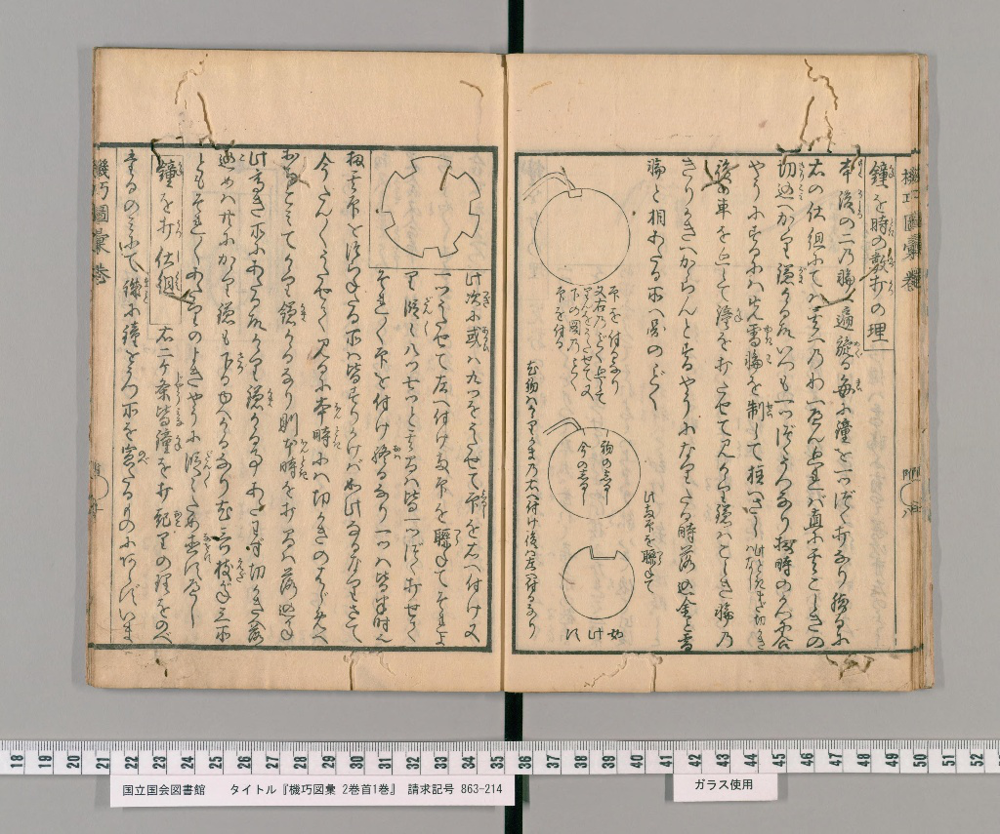

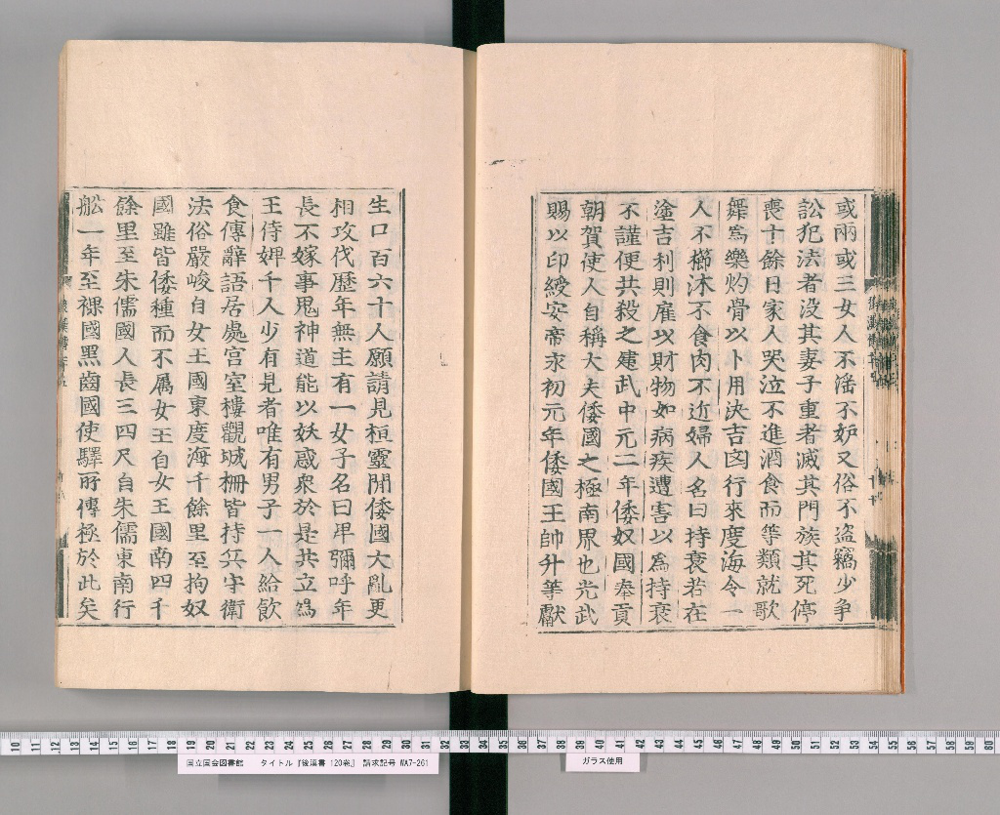

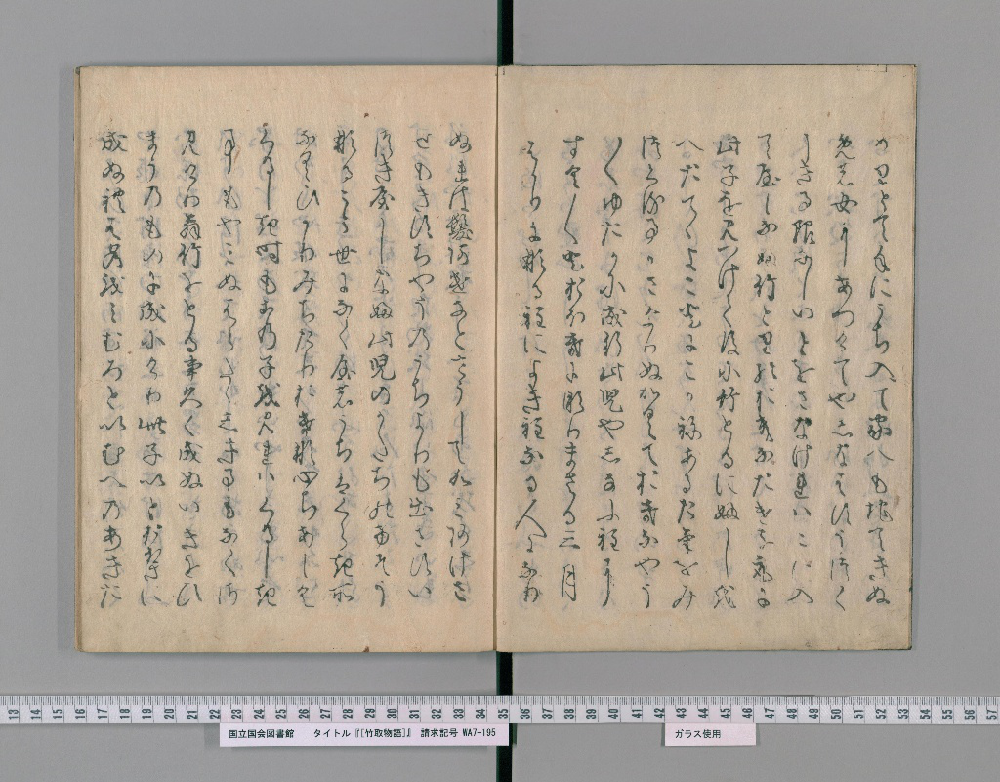

In [8]:
from IPython.display import display
from PIL import Image
import glob
images = []
for fpath in glob.glob("/content/testimages/img/*.jpg"):
    images.append(Image.open(fpath))
display(*images)

# 6. OCRの実行

/content/testimages以下のimgディレクトリ内の画像を処理し、
/content/testimages_outputに出力する場合

In [9]:
%cd {PROJECT_DIR}
!rm testimages_output  -rf
!python main.py infer /content/testimages /content/testimages_output -s s 
%cd /content

/content/ndlkotenocr_cli
start inference !
input_root : /content/testimages
output_root : /content/testimages_output
config_file : config.yml
load from config=src/ndl_kotenseki_layout/models/ndl_kotenseki_layout_config.py, checkpoint=src/ndl_kotenseki_layout/models/ndl_kotenseki_layout_v1.pth
load checkpoint from local path: src/ndl_kotenseki_layout/models/ndl_kotenseki_layout_v1.pth
load from preprocessor=src/text_kotenseki_recognition/models/trocr-base-preprocessor, tokenizer=src/text_kotenseki_recognition/models/decoder-roberta-v3, model=src/text_kotenseki_recognition/models/kotenseki-trocr-honkoku-v3
load from checkpoint=src/kotenseki_reading_order/models/kotenseki_reading_order_model.joblib
[{'input_dir': '/content/testimages', 'img_list': ['/content/testimages/img/2544595.jpg', '/content/testimages/img/2544816.jpg', '/content/testimages/img/2568591.jpg'], 'output_dir': '/content/testimages_output/testimages'}]
{'input_dir': '/content/testimages', 'img_list': ['/content/testimages

# 7. 結果の確認
フリーフォントを利用して、画像上にOCRテキストを重ねてみましょう

In [10]:
#描画用にこころ明朝体(https://fontopo.com/?p=520)をダウンロード
!wget https://fontopo.com/fontdata/kokoro.zip
!unzip -o kokoro.zip

--2023-01-24 14:07:02--  https://fontopo.com/fontdata/kokoro.zip
Resolving fontopo.com (fontopo.com)... 163.44.185.233
Connecting to fontopo.com (fontopo.com)|163.44.185.233|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2524476 (2.4M) [application/zip]
Saving to: ‘kokoro.zip’

kokoro.zip          100%[===================>]   2.41M  4.62MB/s    in 0.5s    

2023-01-24 14:07:03 (4.62 MB/s) - ‘kokoro.zip’ saved [2524476/2524476]

Archive:  kokoro.zip
  inflating: ReadMe.txt              
  inflating: __MACOSX/._ReadMe.txt   
  inflating: IPA_Font_License_Agreement_v1.0.txt  
  inflating: __MACOSX/._IPA_Font_License_Agreement_v1.0.txt  
  inflating: Kokoro.otf              
  inflating: __MACOSX/._Kokoro.otf   


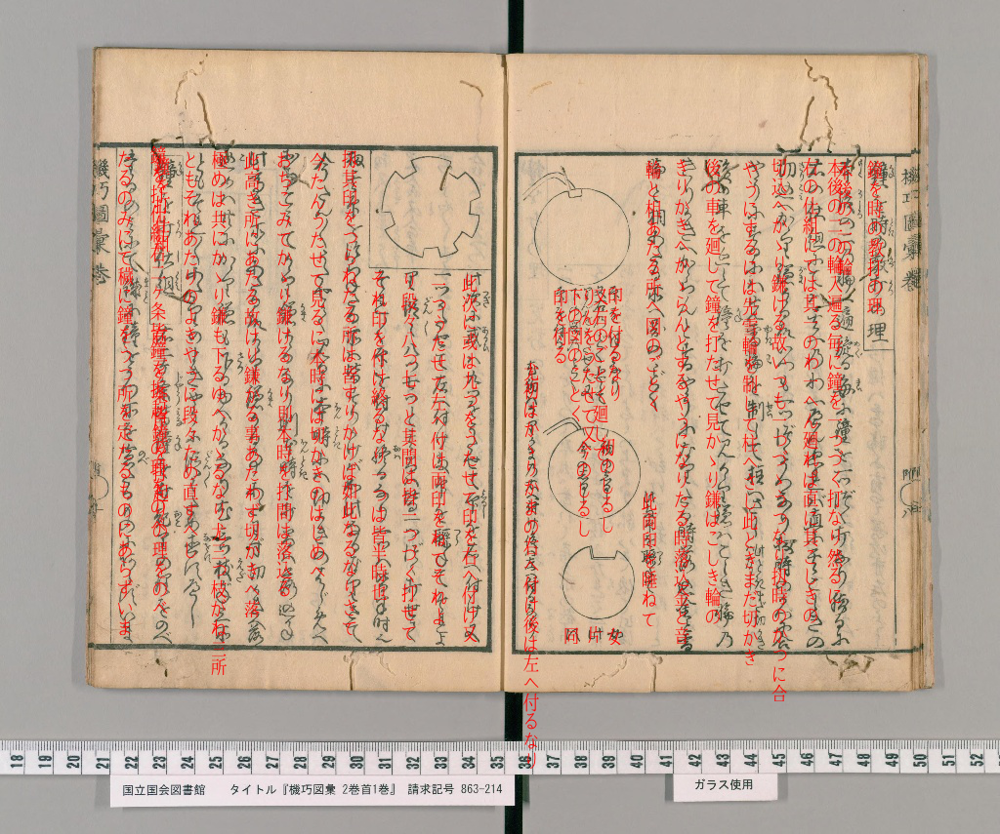

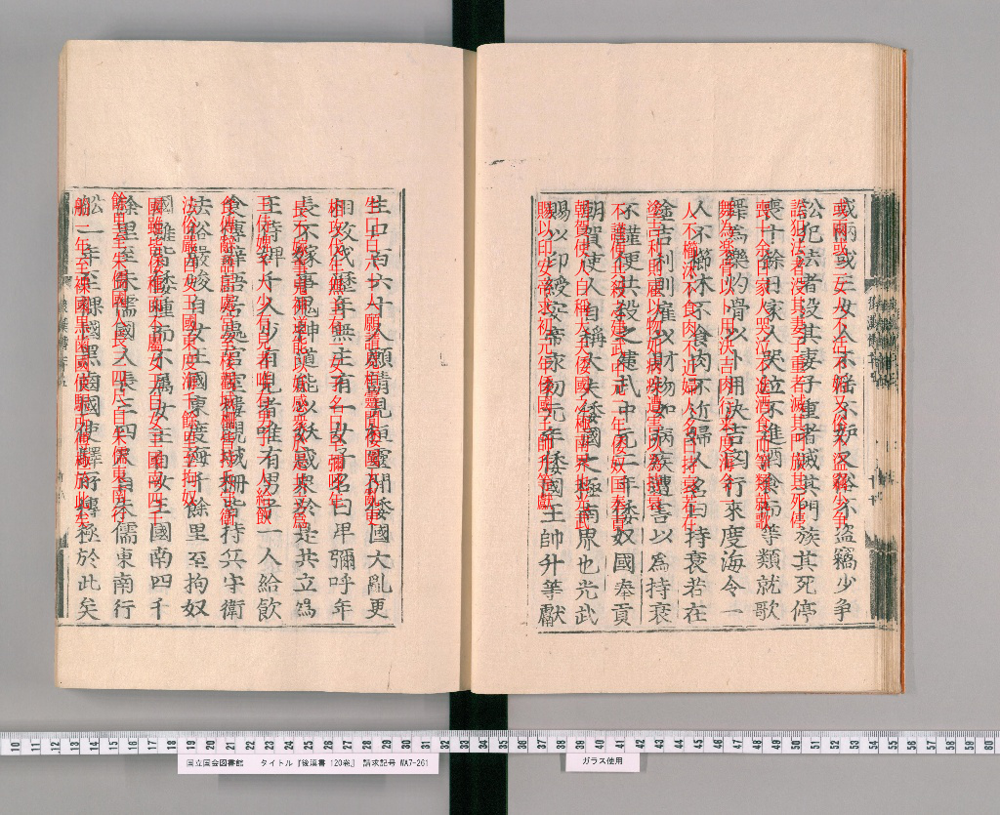

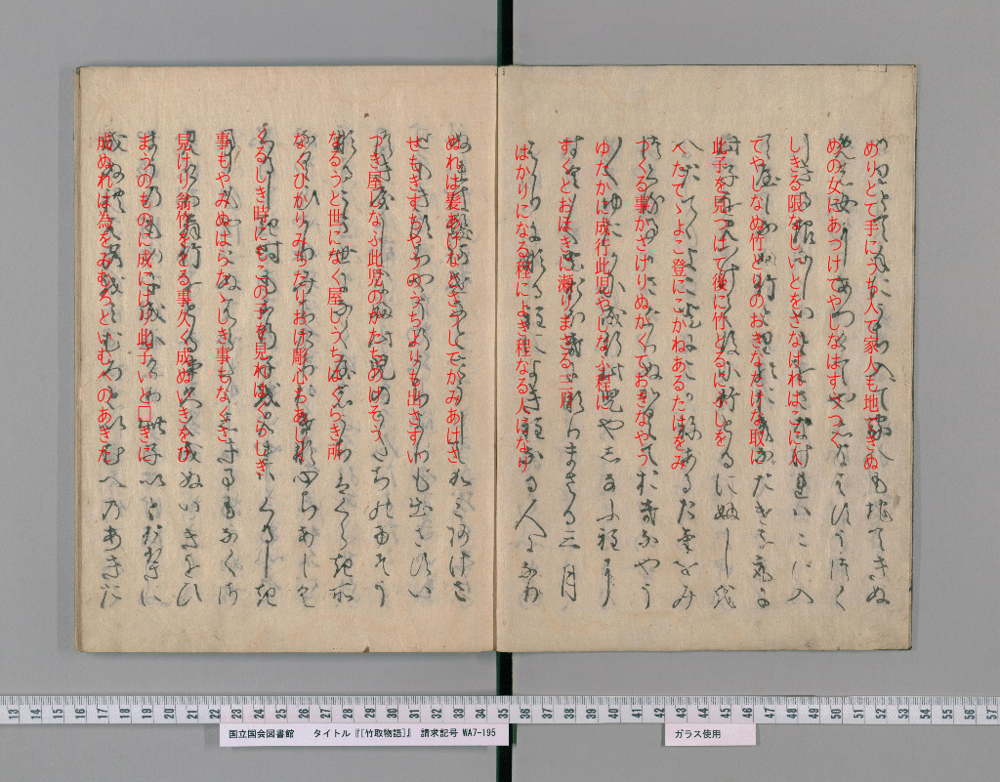

In [12]:
import os
from IPython.display import display
from PIL import Image, ImageDraw, ImageFont
import glob
import json
font = ImageFont.truetype('Kokoro.otf', size=20, layout_engine=ImageFont.LAYOUT_RAQM)
images=[]
for fpath in glob.glob("/content/testimages/img/*.jpg"):
    image = Image.open(fpath)
    draw = ImageDraw.Draw(image)
    jsonpath=os.path.join("/content/testimages_output/testimages/json",os.path.basename(fpath).replace(".jpg",".json"))
    jsonobj={}
    with open(jsonpath)as f:
        jsonobj=json.load(f)

    for rectobj in jsonobj[0]:
        textstr=rectobj["text"]
        x1,y1=rectobj["boundingBox"][0]
        draw.text((x1, y1), textstr,(255,0,0), font=font, direction='ttb', features=['vert'])
    images.append(image)
display(*images)